In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import descartes
from shapely.geometry import Point , Polygon
import seaborn as sns

In [2]:
pwd

'/Users/bahar/Desktop/galvanize_Course/San_Francisco_crime_EDA'

In [3]:
ls

Cap1_map_test.ipynb  cap1_draft.ipynb     images/
README.md            data/                src/


In [4]:
cd data

/Users/bahar/Desktop/galvanize_Course/San_Francisco_crime_EDA/data


In [5]:
ls

Land_Use/             incident_reports.csv


In [6]:
cd ..

/Users/bahar/Desktop/galvanize_Course/San_Francisco_crime_EDA


In [7]:
police_df = pd.read_csv('data/incident_reports.csv')

In [9]:
df_20= police_df[police_df['Incident Year'] ==2020]

In [10]:
crs= {'init': 'epsg:4326'}

In [11]:
geometry = [Point(xy) for xy in zip (df_20['Longitude'], df_20['Latitude'])]


In [12]:
geometry[:3]

In [13]:
geo_df= gpd.GeoDataFrame(df_20, crs= crs , geometry = geometry)

/Users/bahar/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [15]:
street_map = gpd.read_file('data/Land_Use/geo_export_416e71ec-8222-4017-a289-fc1c76459147.shp')

In [16]:
new = geo_df[geo_df['Incident Date']=='2020/05/29'].groupby('Incident Category').count().sort_values(by ="Row ID" , ascending = False)

In [17]:
new

,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Resolution,Intersection,CNN,Police District,Analysis Neighborhood,Supervisor District,Latitude,Longitude,point,geometry
Incident Category,,,,,,,,,,,,,,,,,,,,,
Larceny Theft,65,65,65,65,65,65,65,65,65,29,...,65,63,63,65,63,63,63,63,63,65
Burglary,41,41,41,41,41,41,41,41,41,41,...,41,41,41,41,41,41,41,41,41,41
Malicious Mischief,25,25,25,25,25,25,25,25,25,23,...,25,25,25,25,25,25,25,25,25,25
Motor Vehicle Theft,23,23,23,23,23,23,23,23,23,23,...,23,23,23,23,23,23,23,23,23,23
Non-Criminal,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
Other Miscellaneous,19,19,19,19,19,19,19,19,19,19,...,19,19,19,19,19,19,19,19,19,19
Assault,19,19,19,19,19,19,19,19,19,19,...,19,19,19,19,19,19,19,19,19,19
Recovered Vehicle,13,13,13,13,13,13,13,13,13,10,...,13,10,10,13,10,10,10,10,10,13
Fraud,11,11,11,11,11,11,11,11,11,10,...,11,11,11,11,11,11,11,11,11,11


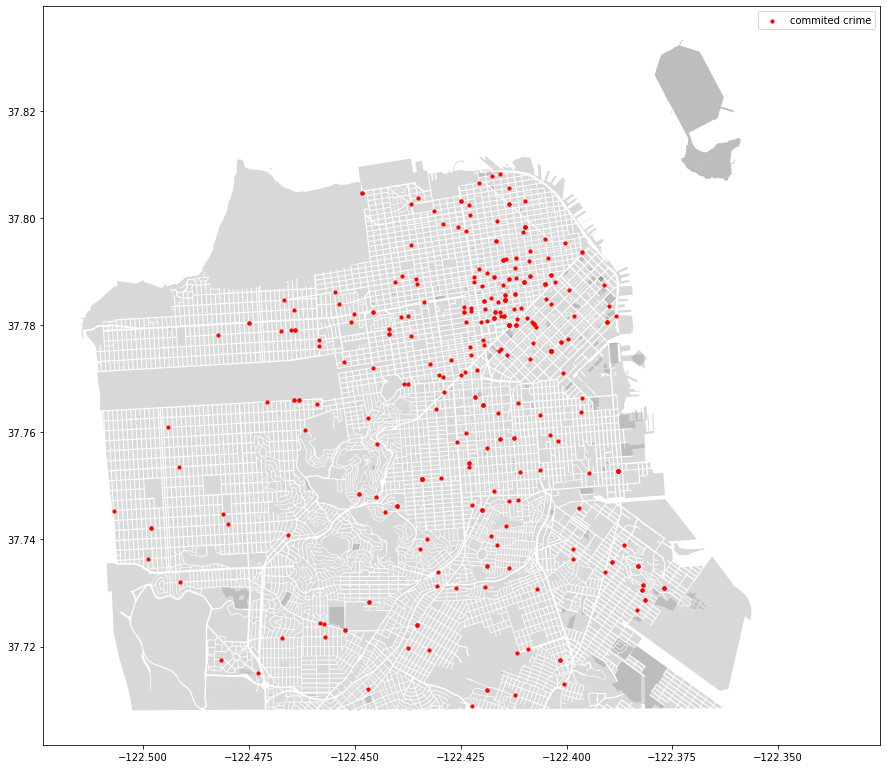

In [18]:
fig , ax = plt.subplots(figsize = (15 , 15))
street_map.plot(ax=ax , alpha = 0.3 , color = 'grey')
geo_df[geo_df['Incident Date']=='2020/05/28'].plot(ax=ax , markersize= 10 , color = 'red', marker = 'o', legend = True, label= 'commited crime')
plt.legend();

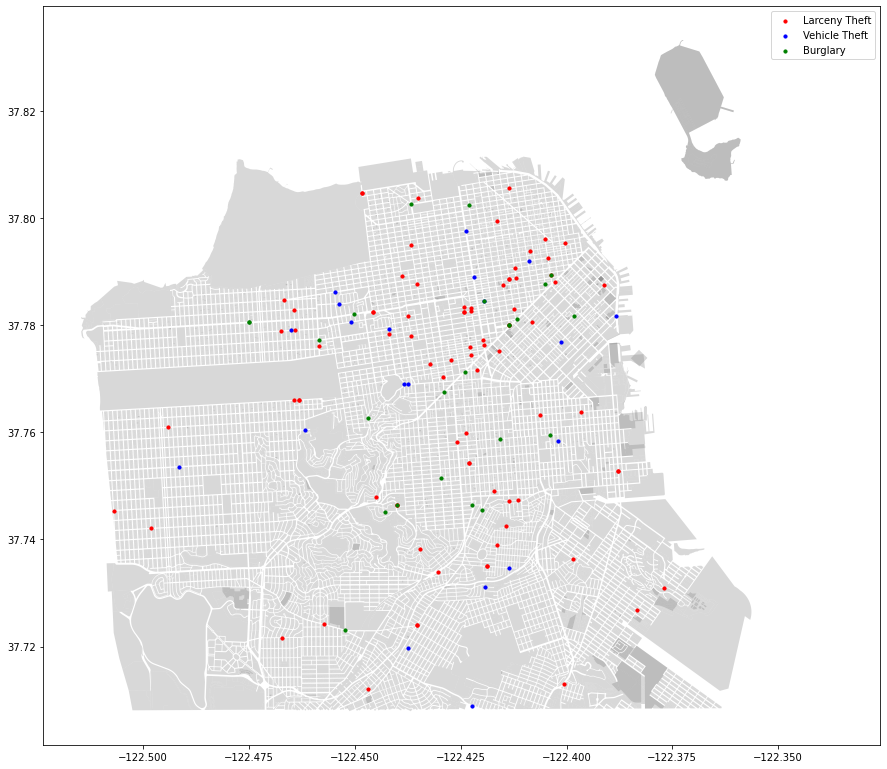

In [19]:
fig , ax = plt.subplots(figsize = (15 , 15))
street_map.plot(ax=ax , alpha = 0.3 , color = 'grey')
geo_df[(geo_df['Incident Date']=='2020/05/28') &( geo_df['Incident Category']=='Larceny Theft')].plot(ax=ax , markersize= 10 , color = 'red', marker = 'o', legend = True, label= 'Larceny Theft')
geo_df[(geo_df['Incident Date']=='2020/05/28') &( geo_df['Incident Category']=='Motor Vehicle Theft')].plot(ax=ax , markersize= 10 , color = 'b', marker = 'o', legend = True, label= 'Vehicle Theft')
geo_df[(geo_df['Incident Date']=='2020/05/28') &( geo_df['Incident Category']=='Burglary')].plot(ax=ax , markersize= 10 , color = 'g', marker = 'o', legend = True, label= 'Burglary')

plt.legend();

In [20]:
geo_df['Incident Date'] = pd.to_datetime(geo_df['Incident Date'])

''

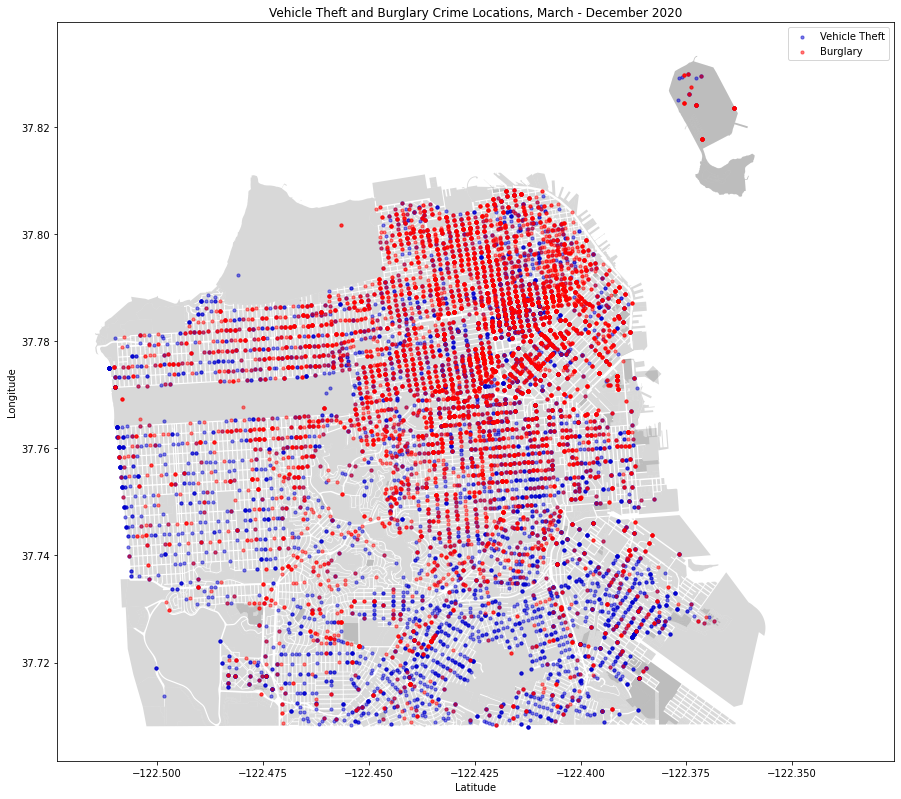

In [87]:
fig , ax = plt.subplots(figsize = (15 , 15))
street_map.plot(ax=ax , alpha = 0.3 , color = 'grey')
#geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month>2) &( geo_df['Incident Category']=='Larceny Theft')].plot(ax=ax , markersize= 10 , color = 'red', marker = 'o', legend = True, label= 'Larceny Theft')
geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month >2) &( geo_df['Incident Category']=='Motor Vehicle Theft')].plot(ax=ax , markersize= 10 , color = 'mediumblue', marker = 'o', legend = True, label= 'Vehicle Theft', alpha = 0.5)
geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month >2) &( geo_df['Incident Category']=='Burglary')].plot(ax=ax , markersize= 10 , color = 'r', marker = 'o', legend = True, label= 'Burglary', alpha = 0.5)

plt.title('Vehicle Theft and Burglary Crime Locations, March - December 2020')
plt.legend()

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')

#plt.savefig('../images/burg_vtheft.png', dpi=80, bbox_inches='tight')
;

''

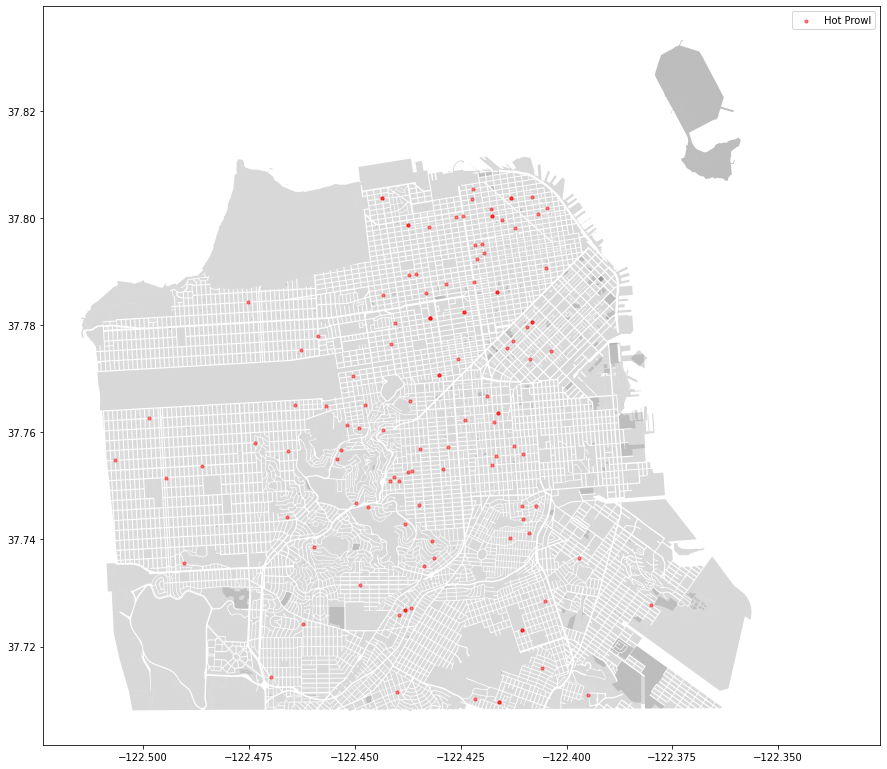

In [95]:
fig , ax = plt.subplots(figsize = (15 , 15))
street_map.plot(ax=ax , alpha = 0.3 , color = 'grey')
#geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month>2) &( geo_df['Incident Category']=='Larceny Theft')].plot(ax=ax , markersize= 10 , color = 'red', marker = 'o', legend = True, label= 'Larceny Theft')
geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month ==7) &( geo_df['Incident Subcategory']=='Burglary - Hot Prowl')].plot(ax=ax , markersize= 10 , color = 'r', marker = 'o', legend = True, label= 'Hot Prowl', alpha = 0.5)
#geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month >2) &( geo_df['Incident Subcategory']=='Burglary - Residential')].plot(ax=ax , markersize= 10 , color = 'yellow', marker = 'o', legend = True, label= 'Residentail Burglary', alpha = 0.5)
#geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month >2) &( geo_df['Incident Subcategory']=='Burglary - Commercial')].plot(ax=ax , markersize= 10 , color = 'blue', marker = 'o', legend = True, label= 'Commercial Burglary', alpha = 0.5)

plt.legend()

#plt.savefig('../images/burg_vtheft.png', dpi=80, bbox_inches='tight')
;

In [22]:
import folium
from folium import plugins
import json

In [23]:
geo_df_0= geo_df.fillna(0)

In [24]:
geo_df_0


,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Resolution,Intersection,CNN,Police District,Analysis Neighborhood,Supervisor District,Latitude,Longitude,point,geometry
648,2020/10/20 11:50:00 PM,2020-10-20,23:50,2020,Tuesday,2020/10/21 12:52:00 AM,97124504134,971245,200634251,202950079.0,...,Open or Active,HOUSTON ST \ COLUMBUS AVE,25526000.0,Central,Russian Hill,3.0,37.803937,-122.415446,"(37.8039365072563, -122.415445868814)",POINT (-122.41545 37.80394)
1469,2020/10/07 08:00:00 PM,2020-10-07,20:00,2020,Wednesday,2020/10/08 01:56:00 PM,97126971000,971269,206147109,0.0,...,Open or Active,0,0.0,Out of SF,0,0.0,0.000000,0.000000,0,POINT (nan nan)
1568,2020/09/26 04:30:00 PM,2020-09-26,16:30,2020,Saturday,2020/10/18 03:58:00 AM,97127571000,971275,206147121,0.0,...,Open or Active,0,0.0,Northern,0,0.0,0.000000,0.000000,0,POINT (nan nan)
2316,2020/10/21 08:33:00 AM,2020-10-21,08:33,2020,Wednesday,2020/10/21 08:34:00 AM,97131007041,971310,200609884,0.0,...,Open or Active,0,0.0,Out of SF,0,0.0,0.000000,0.000000,0,POINT (nan nan)
3593,2020/01/07 04:00:00 AM,2020-01-07,04:00,2020,Tuesday,2020/02/06 09:41:00 AM,90012406372,900124,206027460,0.0,...,Open or Active,0,0.0,Out of SF,0,0.0,0.000000,0.000000,0,POINT (nan nan)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446530,2020/11/24 09:41:00 PM,2020-11-24,21:41,2020,Tuesday,2020/11/24 09:41:00 PM,101580815161,1015808,200711285,203293082.0,...,Exceptional Adult,FILLMORE ST \ TURK ST,25973000.0,Northern,Western Addition,5.0,37.780496,-122.432140,"(37.78049625961115, -122.43214039079034)",POINT (-122.43214 37.78050)
446536,2020/12/01 10:00:00 AM,2020-12-01,10:00,2020,Tuesday,2021/03/24 10:15:00 AM,101576271000,1015762,210183737,210831017.0,...,Open or Active,GEARY ST \ POLK ST,25182000.0,Northern,Tenderloin,6.0,37.785893,-122.419739,"(37.78589290013101, -122.41973873477666)",POINT (-122.41974 37.78589)
446548,2020/06/11 07:30:00 PM,2020-06-11,19:30,2020,Thursday,2020/06/14 05:02:00 PM,101581815200,1015818,200359857,201661909.0,...,Exceptional Adult,LAGUNA ST \ GOLDEN GATE AVE,25959000.0,Northern,Western Addition,5.0,37.780193,-122.427017,"(37.780193029586776, -122.42701675772301)",POINT (-122.42702 37.78019)
446590,2020/11/24 09:41:00 PM,2020-11-24,21:41,2020,Tuesday,2020/11/24 09:41:00 PM,101580815200,1015808,200711285,203293082.0,...,Exceptional Adult,FILLMORE ST \ TURK ST,25973000.0,Northern,Western Addition,5.0,37.780496,-122.432140,"(37.78049625961115, -122.43214039079034)",POINT (-122.43214 37.78050)


In [25]:
SF_coords = (37.733795, -122.446747)
SFmap = folium.Map(location = SF_coords, zoom_start=12, tiles='Cartodb Positron')
SFmap.add_child(plugins.HeatMap(data=geo_df_0[['Latitude','Longitude']].values, radius=4, blur=2))
SFmap.save('images/heat_map.html')                                         
SFmap

In [26]:
property_crime= df_20[['Incident ID', 'Analysis Neighborhood', 'geometry']].reset_index(drop= True)

In [27]:
property_crime.dropna(inplace= True)

In [28]:
property_crime=property_crime.reset_index(drop = True)

In [29]:
property_crime.rename(columns = {'Analysis Neighborhood':'neighborhood'} , inplace = True)

In [30]:
property_crime.head()

,Incident ID,neighborhood,geometry
0,971245,Russian Hill,POINT (-122.41545 37.80394)
1,956729,Tenderloin,POINT (-122.41405 37.78279)
2,953196,Potrero Hill,POINT (-122.39773 37.75483)
3,953262,Mission,POINT (-122.42204 37.76654)
4,953362,Financial District/South Beach,POINT (-122.40371 37.78404)


In [31]:
property_crime_neigh_count = property_crime.groupby('neighborhood').count().sort_values(by = 'neighborhood').reset_index()

In [32]:
property_crime_neigh_count['test']= np.random.randint(1, 9, property_crime_neigh_count.shape[0])

In [33]:
property_crime_neigh_count.head()

,neighborhood,Incident ID,geometry,test
0,Bayview Hunters Point,8131,8131,1
1,Bernal Heights,2404,2404,3
2,Castro/Upper Market,3611,3611,5
3,Chinatown,1869,1869,4
4,Excelsior,2284,2284,5


In [34]:
SF_coords = (37.733795, -122.446747)
m = folium.Map(location = SF_coords, zoom_start=12, tiles='Cartodb Positron')
#SFmap.add_child(plugins.HeatMap(data=geo_df_0[['Latitude','Longitude']].values, radius=4, blur=2))
#SFmap.save('images/heat_map2.html')                                         
#crime_map






folium.Choropleth(geo_data = 'data/Land_Use/Analysis_Neighborhoods.geojson',
                  name = 'first choropleth',
                  data = property_crime_neigh_count,
                  columns = ['neighborhood' , 'geometry'],
                  key_on='feature.properties.nhood',
                  fill_color="OrRd",
                  fill_opacity=0.7,
                  line_opacity=0.2,
                  legend_name = 'l').add_to(m)

folium.Choropleth(geo_data = 'data/Land_Use/Analysis_Neighborhoods.geojson',
                  name = 'second choropleth',
                  data = property_crime_neigh_count,
                  columns = ['neighborhood' , 'geometry'],
                  key_on='feature.properties.nhood',
                  fill_color="BuPu",
                  fill_opacity=0.7,
                  line_opacity=0.2,
                  legend_name = 'l').add_to(m)

folium.LayerControl().add_to(m)
m                

In [35]:
#fill_color  defaults to blue. Can pass a hex code, color name, or if you are binding data, 
#one of the following color brewer palettes: ‘BuGn’, ‘BuPu’, ‘GnBu’, ‘OrRd’, ‘PuBu’, ‘PuBuGn’, ‘PuRd’, ‘RdPu’, ‘YlGn’, ‘YlGnBu’, ‘YlOrBr’, and ‘YlOrRd’.

In [36]:
geo_vtheft_20 = geo_df[(geo_df['Incident Date'].dt.year ==2020) & (geo_df['Incident Date'].dt.month >2)& (geo_df['Incident Category'] == 'Motor Vehicle Theft')].reset_index(drop= True)

In [37]:
#geo_vtheft_20.groupby('Analysis Neighborhood').count().sort_values(by ='Row ID' , ascending = False).reset_index()

In [96]:
SF_coords = (37.733795, -122.446747)
m = folium.Map(location = SF_coords, zoom_start=12, tiles='Cartodb Positron')
#SFmap.add_child(plugins.HeatMap(data=geo_df_0[['Latitude','Longitude']].values, radius=4, blur=2))
#SFmap.save('images/heat_map2.html')                                         
#crime_map






folium.Choropleth(geo_data = 'data/Land_Use/Analysis_Neighborhoods.geojson',
                  name = 'vehicle theft choropleth',
                  data = geo_vtheft_20.groupby('Analysis Neighborhood').count().reset_index(),
                  columns = ['Analysis Neighborhood' , 'geometry'],
                  key_on='feature.properties.nhood',
                  fill_color="BuPu",
                  fill_opacity=0.7,
                  line_opacity=0.2,
                  legend_name = 'Vehicle Theft Count in 10 months').add_to(m)



folium.Choropleth(geo_data = 'data/Land_Use/Analysis_Neighborhoods.geojson',
                  name = 'Burglary choropleth',
                  data = geo_burg_20.groupby('Analysis Neighborhood').count().reset_index(),
                  columns = ['Analysis Neighborhood' , 'geometry'],
                  key_on='feature.properties.nhood',
                  fill_color="OrRd",
                  fill_opacity=0.7,
                  line_opacity=0.2,
                  legend_name = 'Burglary Count in 10 months').add_to(m)


folium.LayerControl().add_to(m)

m.save('images/choropleth.html')

m                

In [ ]:
geo_vtheft_20.groupby(['Analysis Neighborhood' , 'Incident Date']).count().reset_index(),

In [39]:
geo_burg_20 = geo_df[(geo_df['Incident Date'].dt.year ==2020) & (geo_df['Incident Date'].dt.month >2)& (geo_df['Incident Category'] == 'Burglary')].reset_index(drop= True)

In [41]:
geo_burg_20['month'] = geo_burg_20['Incident Date'].dt.month

In [42]:
geo_burg_20.head()

,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Intersection,CNN,Police District,Analysis Neighborhood,Supervisor District,Latitude,Longitude,point,geometry,month
0,2020/08/13 03:26:00 AM,2020-08-13,03:26,2020,Thursday,2020/08/14 12:55:00 PM,95324605073,953246,200485355,NaN,...,WALLER ST \ CARMELITA ST,25998000.0,Park,Haight Ashbury,8.0,37.770646,-122.434405,"(37.770646047967126, -122.43440451408435)",POINT (-122.43440 37.77065),8
1,2020/07/04 12:00:00 AM,2020-07-04,00:00,2020,Saturday,2020/08/16 11:30:00 AM,95330605071,953306,200435861,202020501.0,...,BOARDMAN PL \ BRYANT ST,23914000.0,Out of SF,South of Market,6.0,37.775161,-122.403636,"(37.7751608100771, -122.40363551943442)",POINT (-122.40364 37.77516),7
2,2020/08/06 11:00:00 PM,2020-08-06,23:00,2020,Thursday,2020/08/16 12:25:00 PM,95336805083,953368,200492269,202291343.0,...,HOWARD ST \ SUMNER ST,24301000.0,Southern,South of Market,6.0,37.776690,-122.411014,"(37.776689832001516, -122.41101441929457)",POINT (-122.41101 37.77669),8
3,2020/07/16 12:00:00 PM,2020-07-16,12:00,2020,Thursday,2020/08/13 01:54:00 PM,95325105073,953251,200432049,NaN,...,FILLMORE ST \ BEACH ST,26786000.0,Northern,Marina,2.0,37.804359,-122.437046,"(37.80435912227808, -122.43704556734586)",POINT (-122.43705 37.80436),7
4,2020/08/15 09:00:00 PM,2020-08-15,21:00,2020,Saturday,2020/08/16 10:15:00 AM,95330805081,953308,200492429,202290996.0,...,CLAY ST \ CHERRY ST,27571000.0,Richmond,Presidio Heights,2.0,37.787809,-122.457058,"(37.78780934183433, -122.45705805538128)",POINT (-122.45706 37.78781),8


In [48]:
burg_by_hood= geo_burg_20.groupby(['Analysis Neighborhood']).count().reset_index().iloc[:,:3]

In [49]:
burg_by_hood.rename(columns= {'Incident Datetime': 'Count'}, inplace= True)

In [50]:
burg_by_hood.head()

,Analysis Neighborhood,Count,Incident Date
0,Bayview Hunters Point,222,222
1,Bernal Heights,167,167
2,Castro/Upper Market,360,360
3,Chinatown,102,102
4,Excelsior,78,78


In [55]:
burg_by_hood['percentage'] = (burg_by_hood['Count']/burg_by_hood['Count'].sum())*100

In [64]:
burg_by_hood.sort_values(by = 'percentage', ascending = False)

,Analysis Neighborhood,Count,Incident Date,percentage
18,Mission,649,649,8.157366
5,Financial District/South Beach,644,644,8.094520
33,South of Market,539,539,6.774761
35,Tenderloin,420,420,5.279035
16,Marina,418,418,5.253896
9,Hayes Valley,382,382,4.801408
26,Pacific Heights,367,367,4.612871
2,Castro/Upper Market,360,360,4.524887
31,Russian Hill,295,295,3.707893
20,Nob Hill,292,292,3.670186


In [72]:
geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month >2)].groupby('Analysis Neighborhood').count()

,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Incident Description,Resolution,Intersection,CNN,Police District,Supervisor District,Latitude,Longitude,point,geometry
Analysis Neighborhood,,,,,,,,,,,,,,,,,,,,,
Bayview Hunters Point,6709,6709,6709,6709,6709,6709,6709,6709,6709,6351,...,6709,6709,6709,6709,6709,6709,6709,6709,6709,6709
Bernal Heights,1918,1918,1918,1918,1918,1918,1918,1918,1918,1666,...,1918,1918,1918,1918,1918,1918,1918,1918,1918,1918
Castro/Upper Market,3006,3006,3006,3006,3006,3006,3006,3006,3006,2431,...,3006,3006,3006,3006,3006,3006,3006,3006,3006,3006
Chinatown,1413,1413,1413,1413,1413,1413,1413,1413,1413,1307,...,1413,1413,1413,1413,1413,1413,1413,1413,1413,1413
Excelsior,1959,1959,1959,1959,1959,1959,1959,1959,1959,1809,...,1959,1959,1959,1959,1959,1959,1959,1959,1959,1959
Financial District/South Beach,5339,5339,5339,5339,5339,5339,5339,5339,5339,4516,...,5339,5339,5339,5339,5339,5339,5339,5339,5339,5339
Glen Park,625,625,625,625,625,625,625,625,625,508,...,625,625,625,625,625,625,625,625,625,625
Golden Gate Park,816,816,816,816,816,816,816,816,816,637,...,816,816,816,816,816,816,816,816,816,816
Haight Ashbury,1635,1635,1635,1635,1635,1635,1635,1635,1635,1229,...,1635,1635,1635,1635,1635,1635,1635,1635,1635,1635


In [74]:
geo_df[(geo_df['Incident Date'].dt.year==2020)&(geo_df['Incident Date'].dt.month >2) & (geo_df['Incident Category']== 'Burglary')].groupby('Analysis Neighborhood').count()

,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Incident Description,Resolution,Intersection,CNN,Police District,Supervisor District,Latitude,Longitude,point,geometry
Analysis Neighborhood,,,,,,,,,,,,,,,,,,,,,
Bayview Hunters Point,222,222,222,222,222,222,222,222,222,215,...,222,222,222,222,222,222,222,222,222,222
Bernal Heights,167,167,167,167,167,167,167,167,167,154,...,167,167,167,167,167,167,167,167,167,167
Castro/Upper Market,360,360,360,360,360,360,360,360,360,323,...,360,360,360,360,360,360,360,360,360,360
Chinatown,102,102,102,102,102,102,102,102,102,95,...,102,102,102,102,102,102,102,102,102,102
Excelsior,78,78,78,78,78,78,78,78,78,72,...,78,78,78,78,78,78,78,78,78,78
Financial District/South Beach,644,644,644,644,644,644,644,644,644,585,...,644,644,644,644,644,644,644,644,644,644
Glen Park,63,63,63,63,63,63,63,63,63,56,...,63,63,63,63,63,63,63,63,63,63
Golden Gate Park,43,43,43,43,43,43,43,43,43,38,...,43,43,43,43,43,43,43,43,43,43
Haight Ashbury,246,246,246,246,246,246,246,246,246,216,...,246,246,246,246,246,246,246,246,246,246


In [83]:
SF_coords = (37.733795, -122.446747)
m = folium.Map(location = SF_coords, zoom_start=12, tiles='Cartodb Positron')
#SFmap.add_child(plugins.HeatMap(data=geo_df_0[['Latitude','Longitude']].values, radius=4, blur=2))
#SFmap.save('images/heat_map2.html')                                         
#crime_map






folium.Choropleth(geo_data = 'data/Land_Use/Analysis_Neighborhoods.geojson',
                  name = 'burg choropleth',
                  data = burg_by_hood,
                  columns = ['Analysis Neighborhood' , 'percentage'],
                  key_on='feature.properties.nhood',
                  fill_color="OrRd",
                  fill_opacity=0.7,
                  line_opacity=0.2,
                  legend_name = 'percentage of burglary per neighborhood').add_to(m)
folium.Marker(
    location=[37.76,-122.41595464350685],
    popup='<b>Mission</b><br>burgulary: 649<br>total crime count:8866',
    tooltip = "Click for more"
).add_to(m)

folium.Marker(
    location=[37.785,-122.45],
    popup='<b>Presidio Heights</b><br>burgulary: 367 <br>total crime count:787',
    tooltip = "Click for more"
).add_to(m)


folium.LayerControl().add_to(m)

m.save('images/choropleth.html')

m                

In [ ]:
bay_view= burg_by_hood_month[burg_by_hood_month['Analysis Neighborhood']=='Bayview Hunters Point']

In [ ]:
bay_view

In [ ]:
fig , ax = plt.subplots(figsize = (16 , 30))
ax = sns.violinplot(x="month",y = 'Analysis Neighborhood', data=geo_burg_20)
ax.set_xlim(0,12)
#     sns.catplot(y=col, x="hour", kind="violin", inner=None, data=df, ax = ax, pallete = "GnBu_d", order = ordering)
#ax.set_title(title)
#ax.set_ylabel(None)
#ax.set_xlabel('Hour of day')
#name=filename(title)
#save_location='images/'+name + '_violin_plot.png'
#plt.savefig(save_location, bbox_inches="tight")

In [ ]:
top_vtheft= geo_vtheft_20.groupby('Analysis Neighborhood').count().sort_values(by = 'Row ID', ascending = False).reset_index().iloc[:6, :2]

In [ ]:
top_vtheft

In [ ]:
top_burg= geo_burg_20.groupby('Analysis Neighborhood').count().sort_values(by = 'Row ID', ascending = False).reset_index().iloc[:6, :2]

In [ ]:
top_burg

In [ ]:
fig , ax = plt.subplots(figsize = (16 , 100))
ax = sns.violinplot(x="month",y = 'Intersection', data=geo_burg_20[geo_burg_20['Analysis Neighborhood'] =='Mission'])
ax.set_xlim(0,12)
#sns.catplot(y=col, x="hour", kind="violin", inner=None, data=df, ax = ax, pallete = "GnBu_d", order = ordering)
#ax.set_title(title)
#ax.set_ylabel(None)
#ax.set_xlabel('Hour of day')
#name=filename(title)
#save_location='images/'+name + '_violin_plot.png'
#plt.savefig(save_location, bbox_inches="tight")